In [2]:
import torch
import argparse
from f5_tts.model.utils import get_tokenizer
import warnings; warnings.filterwarnings("ignore")

In [3]:
# Path to your checkpoints
# before_ckpt = "/work/users/r/p/rphadke/JSALT/ckpts/fisher_chunks_1K_LoRAv3.4/model_1000.pt"
after_ckpt = "/work/users/r/p/rphadke/JSALT/ckpts/fisher_chunks_1K_LoRAv3.5/model_29000.pt"
tok_path = "/work/users/r/p/rphadke/JSALT/fisher_chunks_0.1K_v2.1/vocab.txt"
vocab_char_map, vocab_size = get_tokenizer(tok_path, "custom")

# ID of your new speaker token (e.g. tokenizer.convert_tokens_to_ids("<spk>"))
spk_chg_token = "-"

    # 1) Load state dicts
# sd_before = torch.load(before_ckpt,  map_location="cpu")["model_state_dict"]
# print("\n == Prior Checkpoint ==")
# print(set(sd_before.keys()))
sd_after  = torch.load(after_ckpt,  map_location="cpu")["model_state_dict"]
sd_after = {k.replace("ema_model.", ""): v for k, v in sd_after.items()}
print("\n == New Checkpoint ==")

# for key in sd_after.keys():
#     if "tac" in key:
#         print(key)

# print(set(sd_after.keys()))


 == New Checkpoint ==


In [34]:
for key in sd_after.keys():
    if "to_q" in key:
        print(key)

base_model.model.transformer.transformer_blocks.0.attn.to_q.base_layer.weight
base_model.model.transformer.transformer_blocks.0.attn.to_q.base_layer.bias
base_model.model.transformer.transformer_blocks.0.attn.to_q.lora_A.default.weight
base_model.model.transformer.transformer_blocks.0.attn.to_q.lora_B.default.weight
base_model.model.transformer.transformer_blocks.1.attn.to_q.base_layer.weight
base_model.model.transformer.transformer_blocks.1.attn.to_q.base_layer.bias
base_model.model.transformer.transformer_blocks.1.attn.to_q.lora_A.default.weight
base_model.model.transformer.transformer_blocks.1.attn.to_q.lora_B.default.weight
base_model.model.transformer.transformer_blocks.2.attn.to_q.base_layer.weight
base_model.model.transformer.transformer_blocks.2.attn.to_q.base_layer.bias
base_model.model.transformer.transformer_blocks.2.attn.to_q.lora_A.default.weight
base_model.model.transformer.transformer_blocks.2.attn.to_q.lora_B.default.weight
base_model.model.transformer.transformer_block

In [4]:
from f5_tac.model.reccfm import CFMWithTACRecon
from f5_tac.model.backbones.dittac import DiTWithTAC

from f5_tac.configs.model_kwargs import mel_spec_kwargs, dit_cfg, lora_configv2

from peft import get_peft_model

# --- 4. Instantiate Your New Models ---
print("Instantiating F5-TAC models...")
transformer_backbone = DiTWithTAC(
    **dit_cfg,
    num_speakers=2, # Critical for TAC blocks
    text_num_embeds=vocab_size,
    mel_dim=mel_spec_kwargs["n_mel_channels"]
)

model = CFMWithTACRecon(
    transformer=transformer_backbone,
    mel_spec_kwargs=mel_spec_kwargs,
    vocab_char_map=vocab_char_map,
)

model = get_peft_model(model, lora_configv2)

model.load_state_dict(sd_after)

Instantiating F5-TAC models...


The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers and GPU quantization are unavailable.


<All keys matched successfully>

Layer 0: TAC alpha = 0.00013
Layer 1: TAC alpha = 0.00012
Layer 2: TAC alpha = 0.00012
Layer 3: TAC alpha = 0.00013
Layer 4: TAC alpha = -0.00011
Layer 5: TAC alpha = -0.00014
Layer 6: TAC alpha = 0.00008
Layer 7: TAC alpha = 0.00016
Layer 8: TAC alpha = 0.00014
Layer 9: TAC alpha = 0.00016
Layer 10: TAC alpha = 0.00016
Layer 11: TAC alpha = -0.00014
Layer 12: TAC alpha = -0.00014
Layer 13: TAC alpha = -0.00014
Layer 14: TAC alpha = 0.00014
Layer 15: TAC alpha = -0.00014
Layer 16: TAC alpha = 0.00016
Layer 17: TAC alpha = -0.00015
Layer 18: TAC alpha = -0.00016
Layer 19: TAC alpha = 0.00014
Layer 20: TAC alpha = -0.00008
Layer 21: TAC alpha = -0.00015


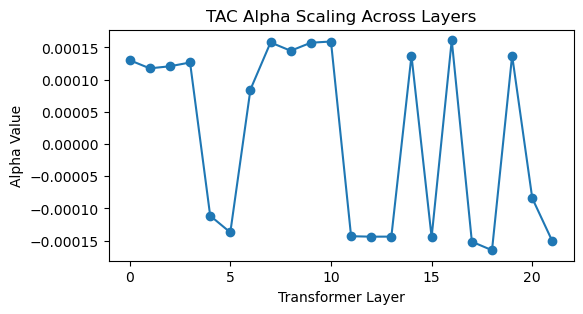

In [5]:
import matplotlib.pyplot as plt

alphas = []
for i, block in enumerate(model.transformer.transformer_blocks):
    alpha_val = block.tac.alpha.item()
    alphas.append(alpha_val)
    print(f"Layer {i}: TAC alpha = {alpha_val:.5f}")

plt.figure(figsize=(6,3))
plt.plot(alphas, marker='o')
plt.title("TAC Alpha Scaling Across Layers")
plt.xlabel("Transformer Layer")
plt.ylabel("Alpha Value")
plt.show()

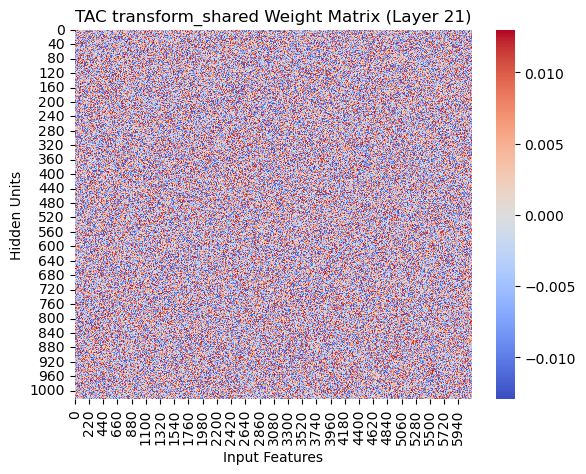

In [31]:
import seaborn as sns

# Extract weights
weight = sd_after[
    "base_model.model.transformer.transformer_blocks.21.tac.transform_final.0.weight"
]
sns.heatmap(weight.numpy(), cmap="coolwarm")
plt.title("TAC transform_shared Weight Matrix (Layer 21)")
plt.xlabel("Input Features")
plt.ylabel("Hidden Units")
plt.show()


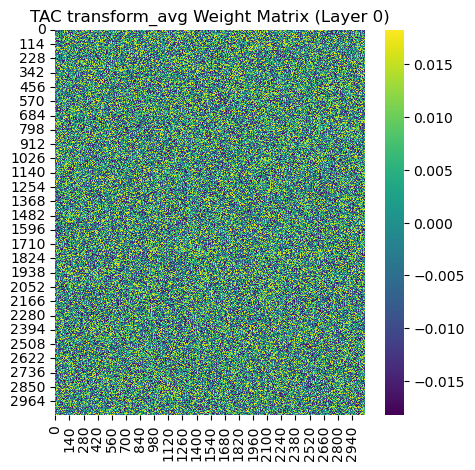

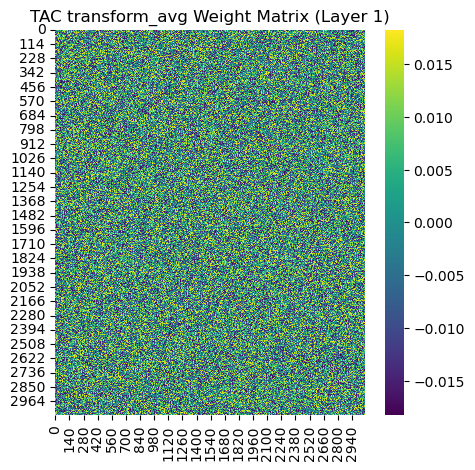

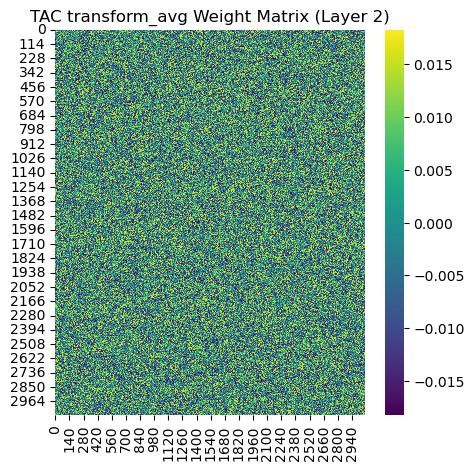

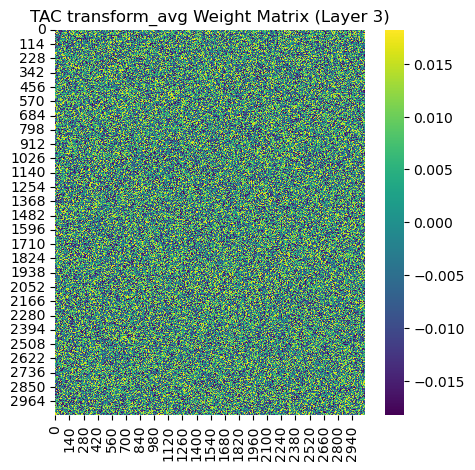

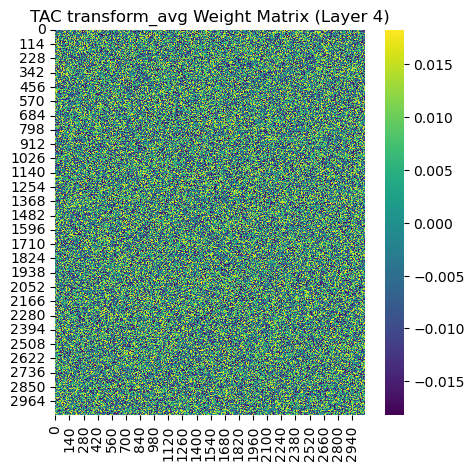

...

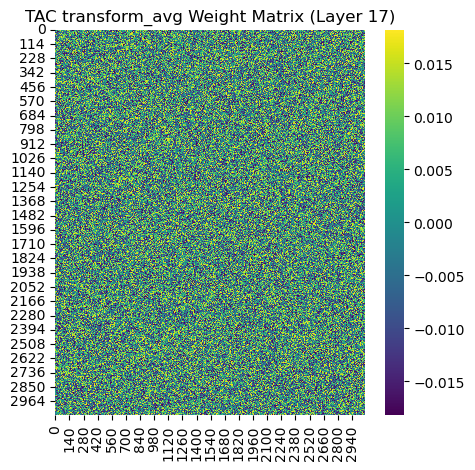

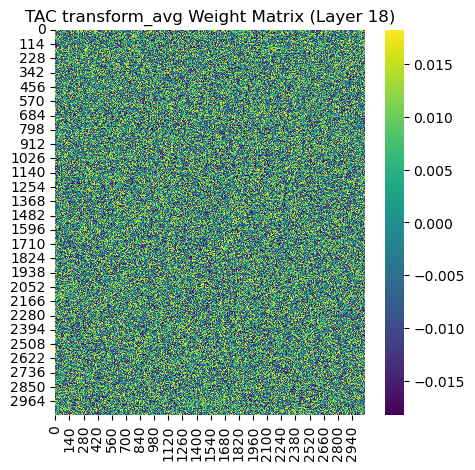

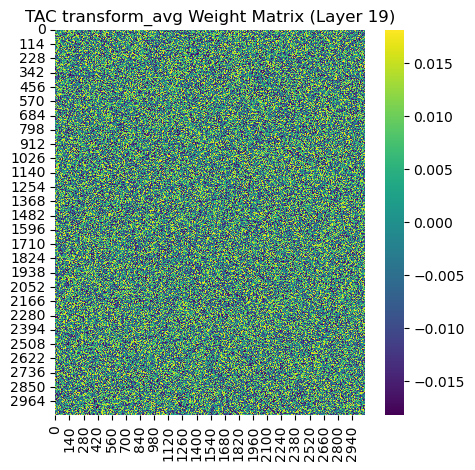

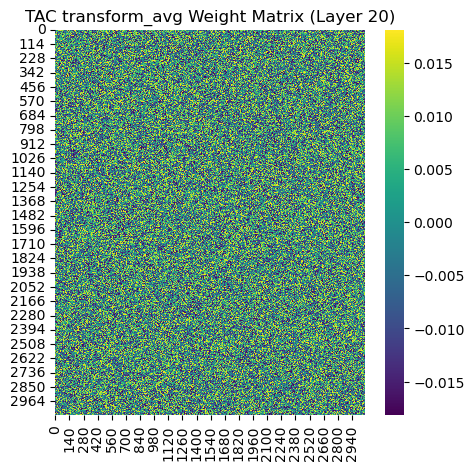

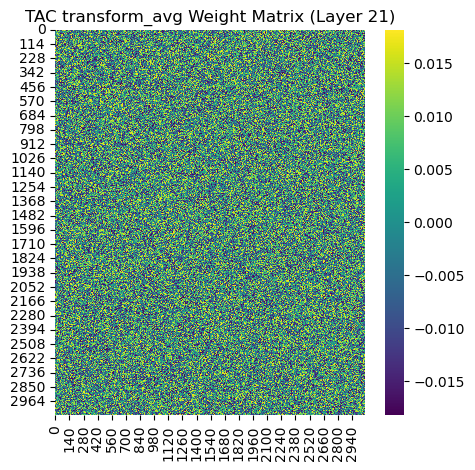

In [32]:
# Loop over transformer layers
N=22
for i in range(N):  # N = total number of layers
    key = f"base_model.model.transformer.transformer_blocks.{i}.tac.transform_avg.0.weight"
    w = sd_after[key]
    plt.figure(figsize=(5,5))
    sns.heatmap(w.numpy(), cmap="viridis")
    plt.title(f"TAC transform_avg Weight Matrix (Layer {i})")
    plt.show()

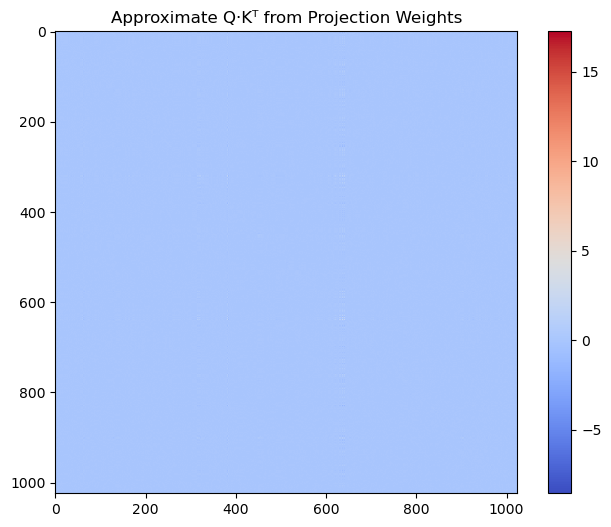

In [39]:
q_weight = sd_after[
    "base_model.model.transformer.transformer_blocks.21.attn.to_q.base_layer.weight"
]  # shape: (dim_heads * heads, dim)

k_weight = sd_after[
    "base_model.model.transformer.transformer_blocks.21.attn.to_k.base_layer.weight"
] 

# Dot product between rows of W_q and W_k
approx_qk = q_weight @ k_weight.T  # shape: (heads * dim_head, heads * dim_head)

plt.figure(figsize=(8,6))
plt.imshow(approx_qk.numpy(), cmap="coolwarm")
plt.title("Approximate Q·Kᵀ from Projection Weights")
plt.colorbar()
plt.show()